<h1 align = 'center'>Intrusion Detection In Wireless Sensor Networks</h1>
<hr>


<img src="https://psiborg.in/wp-content/uploads/2021/07/Embedded-banner-2048_11zon-1.jpg" alt="wsn-google-image" width="1000" height="1000">
<br>
<code>img credit: psiborg</code>


In [90]:
#primary utils
import numpy as np
import pandas as pd
from pandas_profiling import profile_report
from pandas.plotting import scatter_matrix
import seaborn as sns
import matplotlib.pyplot as plt


#sklearn
import sklearn
from sklearn.preprocessing import FunctionTransformer,LabelEncoder

from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.model_selection import (train_test_split,
                                     GridSearchCV,
                                     RepeatedStratifiedKFold,
                                     cross_val_score)

from sklearn.metrics import (precision_recall_curve,
                             precision_recall_fscore_support,
                             roc_auc_score,
                             plot_confusion_matrix,
                             roc_curve,
                             precision_score,
                             recall_score,
                             accuracy_score,
                             plot_precision_recall_curve)

#models
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier,RandomForestClassifier

# -- xgboost
import xgboost
from xgboost import XGBClassifier

#torch
# from torch import nn
# from skorch import NeuralNetClassifier

# -- stacking
import mlxtend
from mlxtend.classifier import StackingClassifier

#imblean tools for handling imablaced dataset
import imblearn
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE,BorderlineSMOTE,ADASYN 
from imblearn.under_sampling import RandomUnderSampler

#other
import warnings
warnings.filterwarnings("ignore")
from collections import Counter

#wandb - logging
import wandb

In [91]:
print("sklean version :", sklearn.__version__)
print("imblearn version :", imblearn.__version__)
print("wandb version :", wandb.__version__)
print("pandas :",pd.__version__)
print("numpy :",np.__version__)
print("seaborn :", sns.__version__)
print("mlxtend :", mlxtend.__version__)
print("xgboost :",xgboost.__version__)

sklean version : 1.1.3
imblearn version : 0.9.1
wandb version : 0.13.4
pandas : 1.4.4
numpy : 1.23.3
seaborn : 0.12.0
mlxtend : 0.21.0
xgboost : 1.5.0


In [4]:
wandb.login(force = True)

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin


True

In [10]:
run = wandb.init(project="wsn-intrusion-detection", entity="mk-armah")

In [5]:
df = pd.read_csv("./WSN-DS.csv")
df.head(10)

,id,Time,Is_CH,who CH,Dist_To_CH,ADV_S,ADV_R,JOIN_S,JOIN_R,SCH_S,SCH_R,Rank,DATA_S,DATA_R,Data_Sent_To_BS,dist_CH_To_BS,send_code,Expaned Energy,Attack type
0,101000,50,1,101000,0.00000,1,0,0,25,1,0,0,0,1200,48,130.08535,0,2.46940,Normal
1,101001,50,0,101044,75.32345,0,4,1,0,0,1,2,38,0,0,0.00000,4,0.06957,Normal
2,101002,50,0,101010,46.95453,0,4,1,0,0,1,19,41,0,0,0.00000,3,0.06898,Normal
3,101003,50,0,101044,64.85231,0,4,1,0,0,1,16,38,0,0,0.00000,4,0.06673,Normal
4,101004,50,0,101010,4.83341,0,4,1,0,0,1,25,41,0,0,0.00000,3,0.06534,Normal
5,101005,50,0,101010,31.91198,0,4,1,0,0,1,18,41,0,0,0.00000,3,0.06717,Normal
6,101006,50,0,101044,24.34167,0,4,1,0,0,1,5,38,0,0,0.00000,4,0.06214,Normal
7,101007,50,0,101010,26.75033,0,4,1,0,0,1,21,41,0,0,0.00000,3,0.06662,Normal
8,101008,50,0,101044,63.66485,0,4,1,0,0,1,17,38,0,0,0.00000,4,0.06649,Normal
9,101009,50,0,101000,32.90217,0,4,1,0,0,1,12,48,0,0,0.00000,1,0.07903,Normal


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 374661 entries, 0 to 374660
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0    id               374661 non-null  int64  
 1    Time             374661 non-null  int64  
 2    Is_CH            374661 non-null  int64  
 3    who CH           374661 non-null  int64  
 4    Dist_To_CH       374661 non-null  float64
 5    ADV_S            374661 non-null  int64  
 6    ADV_R            374661 non-null  int64  
 7    JOIN_S           374661 non-null  int64  
 8    JOIN_R           374661 non-null  int64  
 9    SCH_S            374661 non-null  int64  
 10   SCH_R            374661 non-null  int64  
 11  Rank              374661 non-null  int64  
 12   DATA_S           374661 non-null  int64  
 13   DATA_R           374661 non-null  int64  
 14   Data_Sent_To_BS  374661 non-null  int64  
 15   dist_CH_To_BS    374661 non-null  float64
 16   send_code        37

In [7]:
df.describe(include = int)

,id,Time,Is_CH,who CH,ADV_S,ADV_R,JOIN_S,JOIN_R,SCH_S,SCH_R,Rank,DATA_S,DATA_R,Data_Sent_To_BS,send_code
count,3.746610e+05,374661.000000,374661.000000,3.746610e+05,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000
mean,2.749693e+05,1064.748712,0.115766,2.749804e+05,0.267698,6.940562,0.779905,0.737493,0.288984,0.747452,9.687104,44.857925,73.890045,4.569448,2.497957
std,3.898986e+05,899.646164,0.319945,3.899112e+05,2.061148,7.044319,0.414311,4.691498,2.754746,0.434475,14.681901,42.574464,230.246335,19.679155,2.407337
min,1.010000e+05,50.000000,0.000000,1.010000e+05,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.070930e+05,353.000000,0.000000,1.070960e+05,0.000000,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,13.000000,0.000000,0.000000,1.000000
50%,1.160710e+05,803.000000,0.000000,1.160720e+05,0.000000,5.000000,1.000000,0.000000,0.000000,1.000000,3.000000,35.000000,0.000000,0.000000,2.000000
75%,2.150720e+05,1503.000000,0.000000,2.150730e+05,0.000000,7.000000,1.000000,0.000000,0.000000,1.000000,13.000000,62.000000,0.000000,0.000000,4.000000
max,3.402096e+06,3600.000000,1.000000,3.402100e+06,97.000000,117.000000,1.000000,124.000000,99.000000,1.000000,99.000000,241.000000,1496.000000,241.000000,15.000000


In [8]:
df.select_dtypes('int').astype(pd.CategoricalDtype()).describe()

,id,Time,Is_CH,who CH,ADV_S,ADV_R,JOIN_S,JOIN_R,SCH_S,SCH_R,Rank,DATA_S,DATA_R,Data_Sent_To_BS,send_code
count,374661,374661,374661,374661,374661,374661,374661,374661,374661,374661,374661,374661,374661,374661,374661
unique,11120,196,2,7088,85,31,2,101,95,2,100,192,1345,237,16
top,101000,53,0,202100,0,4,1,0,0,1,1,0,0,0,0
freq,139,13600,331288,3554,331288,53971,292200,355792,355804,280041,96148,60340,319114,308061,82461


In [9]:
df.select_dtypes(float).describe()

,Dist_To_CH,dist_CH_To_BS,Expaned Energy
count,374661.000000,374661.000000,374661.000000
mean,22.599380,22.562735,0.305661
std,21.955794,50.261604,0.669462
min,0.000000,0.000000,0.000000
25%,4.735440,0.000000,0.056150
50%,18.372610,0.000000,0.097970
75%,33.776000,0.000000,0.217760
max,214.274620,201.934940,45.093940


In [10]:
df.columns

Index([' id', ' Time', ' Is_CH', ' who CH', ' Dist_To_CH', ' ADV_S', ' ADV_R',
       ' JOIN_S', ' JOIN_R', ' SCH_S', ' SCH_R', 'Rank', ' DATA_S', ' DATA_R',
       ' Data_Sent_To_BS', ' dist_CH_To_BS', ' send_code ', 'Expaned Energy',
       'Attack type'],
      dtype='object')

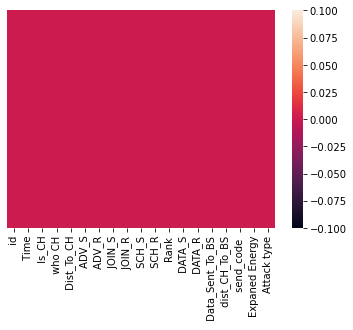

In [11]:
sns.heatmap(df.isna(),yticklabels = False);

In [12]:
lower = lambda x: [i.lower().lstrip() for i in x] #make columns lower case and strip off left whitespacespaces

# df.columns = [x.lower().lstrip() for x in df.columns] 
df.columns = lower(df.columns)

df.columns = [x.replace(' ',"_") for x in df.columns] #replace all spaces in column names with underscore

In [13]:
df.columns

Index(['id', 'time', 'is_ch', 'who_ch', 'dist_to_ch', 'adv_s', 'adv_r',
       'join_s', 'join_r', 'sch_s', 'sch_r', 'rank', 'data_s', 'data_r',
       'data_sent_to_bs', 'dist_ch_to_bs', 'send_code_', 'expaned_energy',
       'attack_type'],
      dtype='object')

In [14]:
df.head()

,id,time,is_ch,who_ch,dist_to_ch,adv_s,adv_r,join_s,join_r,sch_s,sch_r,rank,data_s,data_r,data_sent_to_bs,dist_ch_to_bs,send_code_,expaned_energy,attack_type
0,101000,50,1,101000,0.00000,1,0,0,25,1,0,0,0,1200,48,130.08535,0,2.46940,Normal
1,101001,50,0,101044,75.32345,0,4,1,0,0,1,2,38,0,0,0.00000,4,0.06957,Normal
2,101002,50,0,101010,46.95453,0,4,1,0,0,1,19,41,0,0,0.00000,3,0.06898,Normal
3,101003,50,0,101044,64.85231,0,4,1,0,0,1,16,38,0,0,0.00000,4,0.06673,Normal
4,101004,50,0,101010,4.83341,0,4,1,0,0,1,25,41,0,0,0.00000,3,0.06534,Normal


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 374661 entries, 0 to 374660
Data columns (total 19 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   id               374661 non-null  int64  
 1   time             374661 non-null  int64  
 2   is_ch            374661 non-null  int64  
 3   who_ch           374661 non-null  int64  
 4   dist_to_ch       374661 non-null  float64
 5   adv_s            374661 non-null  int64  
 6   adv_r            374661 non-null  int64  
 7   join_s           374661 non-null  int64  
 8   join_r           374661 non-null  int64  
 9   sch_s            374661 non-null  int64  
 10  sch_r            374661 non-null  int64  
 11  rank             374661 non-null  int64  
 12  data_s           374661 non-null  int64  
 13  data_r           374661 non-null  int64  
 14  data_sent_to_bs  374661 non-null  int64  
 15  dist_ch_to_bs    374661 non-null  float64
 16  send_code_       374661 non-null  int6

In [16]:
not_duplicated = len(df) - len(df[df.duplicated()])
duplicated = len(df) - not_duplicated

print("total number of duplicated rows: ",duplicated)

print("percentage duplicated: {}%".format(round((len(df[df.duplicated()])/len(df))*100,3)))

total number of duplicated rows:  8873
percentage duplicated: 2.368%


In [17]:
len(df) - len(df[df.id.duplicated()])

11120

In [18]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:>

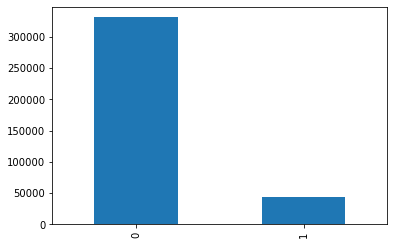

In [21]:
#is_ch; A flag to distinguish whether the node is CH with value 1 or normal node with value 0.
#how many channels are present


df['is_ch'].value_counts().plot(kind = 'bar')

In [22]:
df.attack_type.unique()

array(['Normal', 'Flooding', 'TDMA', 'Grayhole', 'Blackhole'],
      dtype=object)

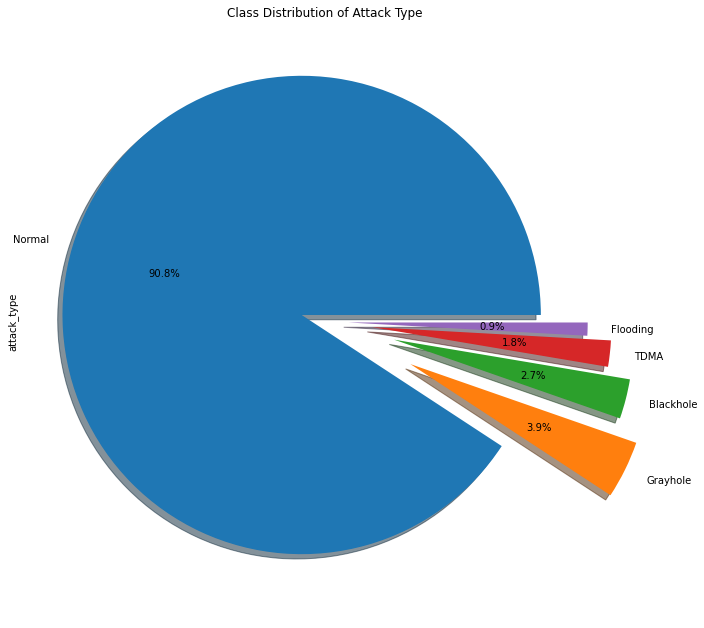

In [23]:
#category distribution
plt.figure(figsize = (11,11))
df['attack_type'].value_counts().plot(kind = 'pie',explode = [0.1,0.4,0.3,0.2,0.1],shadow = True,autopct = '%1.1f%%');
plt.title("Class Distribution of Attack Type");

In [24]:
df.select_dtypes(float)

,dist_to_ch,dist_ch_to_bs,expaned_energy
0,0.00000,130.08535,2.46940
1,75.32345,0.00000,0.06957
2,46.95453,0.00000,0.06898
3,64.85231,0.00000,0.06673
4,4.83341,0.00000,0.06534
...,...,...,...
374656,6.98337,170.14779,0.15974
374657,29.32867,82.21043,0.06877
374658,18.51963,139.26438,0.09437
374659,8.55001,158.27492,0.16047


<Figure size 792x720 with 0 Axes>

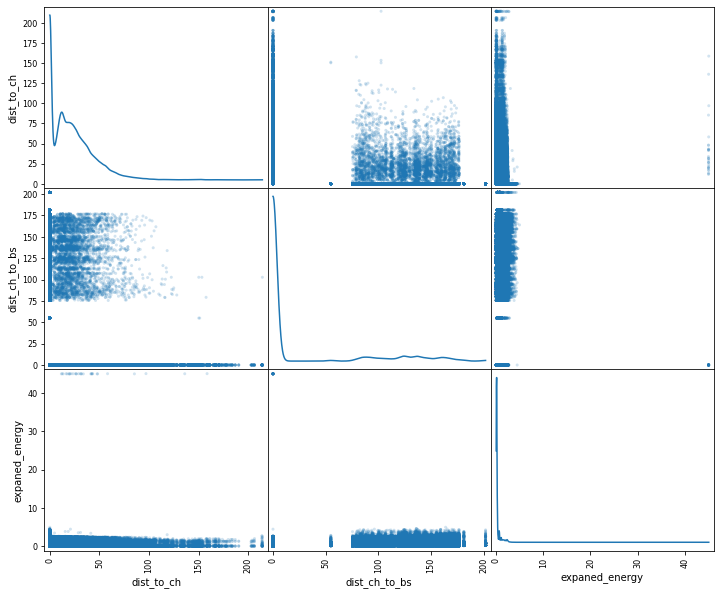

In [26]:
plt.figure(figsize = (11,10));
scatter_matrix(df.select_dtypes(float),figsize = (12,10),grid = True,diagonal = 'kde',alpha = 0.2);

# Assessment Report 
<ul>
    <li>No missing data was found</li>
    <li>2.368% of the data has been found to be duplicated, thats a total of 8873</li>
    <li>Target or predictand is heavily imbalanced, with 'Normal' being the model class covering over 90% samples</li>
</ul>

# Data Splitting and Preprocessing

<hr>

In [27]:
drop_duplicates =  lambda x:x.drop_duplicates()
df = drop_duplicates(df)

In [28]:
#drop_duplicates =  lambda x:x.drop_duplicates() #works but note that lambda functions are not pickleable

def drop_duplicates(X,y):
    """drop duplicates in x
    
    Args:
        X:pandas.DataFrame
    Return:
        pandas.DataFrame | pandas dataframe containing no duplicated values
        """
    data = pd.concat([X,y],axis = 1)
    return data.drop_duplicates()

In [29]:
df.shape

(365788, 19)

In [30]:
#defining features and target variables

X = df.drop(columns = ['attack_type','id'],axis = 1)
y = df['attack_type']

In [94]:
X

,time,is_ch,who_ch,dist_to_ch,adv_s,adv_r,join_s,join_r,sch_s,sch_r,rank,data_s,data_r,data_sent_to_bs,dist_ch_to_bs,send_code_,expaned_energy
0,50,1,101000,0.00000,1,0,0,25,1,0,0,0,1200,48,130.08535,0,2.46940
1,50,0,101044,75.32345,0,4,1,0,0,1,2,38,0,0,0.00000,4,0.06957
2,50,0,101010,46.95453,0,4,1,0,0,1,19,41,0,0,0.00000,3,0.06898
3,50,0,101044,64.85231,0,4,1,0,0,1,16,38,0,0,0.00000,4,0.06673
4,50,0,101010,4.83341,0,4,1,0,0,1,25,41,0,0,0.00000,3,0.06534
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
374656,1003,0,201051,6.98337,0,5,1,0,0,1,7,96,0,67,170.14779,3,0.15974
374657,1003,0,201037,29.32867,0,5,1,0,0,1,31,39,0,24,82.21043,2,0.06877
374658,1003,0,201095,18.51963,0,5,1,0,0,1,17,55,0,31,139.26438,1,0.09437
374659,1003,0,201051,8.55001,0,5,1,0,0,1,3,96,0,65,158.27492,3,0.16047


In [95]:
y

0         Normal
1         Normal
2         Normal
3         Normal
4         Normal
           ...  
374656    Normal
374657    Normal
374658    Normal
374659    Normal
374660    Normal
Name: attack_type, Length: 365788, dtype: object

In [31]:
#applying data splitting with stratified sampling on the target variable due to class imbalance
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=42,stratify = y)

In [32]:
print("samples available for training: ", len(X_train))
print("samples available for testing : ", len(X_test))

samples available for training:  256051
samples available for testing :  109737


In [34]:
#log distribution of the trainnig data to weights and biases (wandb)

# wandb.sklearn.plot_class_proportions(y_train, y_test, list(y.unique()))

In [ ]:
#plot data distribution for training and testing datasets

In [82]:
#initialize sampling strategies to handlle imbalanced target classes

over = SMOTE(sampling_strategy='not majority', k_neighbors=5,random_state=42)

undersample = RandomUnderSampler(sampling_strategy= {'Normal':10217},random_state=42)

borderline_oversample  = BorderlineSMOTE(random_state=111) #variant of smote | oversampling technique

undersample_all = RandomUnderSampler(sampling_strategy = 'all',random_state=42)

## UTILS

In [36]:
import time

def Calc_Inference_Speed(func):
    def wrap(func):
        times = []
        for i in range(10):
            start_time = time.time()
            func.score(X_test,y_test) #score the testing data
            times.append(time.time() - start_time)
        avg_inf_time = times.mean()
        
        return avg_inf_time
    
    return wrap
    

In [48]:
def prfs_metrics(y_true,y_pred):
    
    metrics = pd.DataFrame(

        precision_recall_fscore_support(
                y_true,y_pred,
                labels = y_test.unique()),

        columns = y_test.unique(),
        index = ['precision',
                 'recall',
                 'F-measure',
                 'support']
    )

    return metrics

## K Nearest Neigbors Algorithm

In [32]:
#knn model
knn_model = KNeighborsClassifier(n_neighbors = 5) 

#construct pipeline steps
knn_steps = [('sampling', undersample_all),  ('model',knn_model)]

In [33]:
knn_pipeline = Pipeline(steps= knn_steps)
knn_pipeline

Pipeline(steps=[('sampling', RandomUnderSampler(sampling_strategy='all')),
                ('model', KNeighborsClassifier())])

In [58]:
#Hyper Parameters
knn_pipeline.get_params()

{'memory': None,
 'steps': [('sampling', RandomUnderSampler(sampling_strategy='all')),
  ('model', KNeighborsClassifier())],
 'verbose': False,
 'sampling': RandomUnderSampler(sampling_strategy='all'),
 'model': KNeighborsClassifier(),
 'sampling__random_state': None,
 'sampling__replacement': False,
 'sampling__sampling_strategy': 'all',
 'model__algorithm': 'auto',
 'model__leaf_size': 30,
 'model__metric': 'minkowski',
 'model__metric_params': None,
 'model__n_jobs': None,
 'model__n_neighbors': 5,
 'model__p': 2,
 'model__weights': 'uniform'}

In [59]:
knn_pipeline.fit(X_train,y_train)

Pipeline(steps=[('sampling', RandomUnderSampler(sampling_strategy='all')),
                ('model', KNeighborsClassifier())])

In [60]:
knn_pipeline.score(X_test,y_test)

0.7724377374996583

### Model Tuning - KNN

In [97]:
#parameters for tuning
params = {
    'model__n_neighbors':list(range(1,12,2)),
    'model__metric':['euclidean','cosine','manhattan','l1','l2'],
    'sampling':[over,borderline_oversample]
}

gscv = GridSearchCV(estimator = knn_pipeline,param_grid = params,scoring = 'accuracy',cv = 5,verbose = 3)
gscv

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('sampling',
                                        RandomUnderSampler(sampling_strategy='all')),
                                       ('model', KNeighborsClassifier())]),
             param_grid={'model__metric': ['euclidean', 'cosine', 'manhattan',
                                           'l1', 'l2'],
                         'model__n_neighbors': [1, 3, 5, 7, 9, 11],
                         'sampling': [SMOTE(sampling_strategy='not majority'),
                                      BorderlineSMOTE()]},
             scoring='accuracy', verbose=3)

In [69]:
#35 hours+ tuning time... Do not run, unless under extremely necessary situations

# gscv.fit(X_train,y_train) 

Fitting 10 folds for each of 60 candidates, totalling 600 fits
[CV 1/10] END model__metric=euclidean, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.976 total time= 1.6min
[CV 2/10] END model__metric=euclidean, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.976 total time=  32.0s
[CV 3/10] END model__metric=euclidean, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.974 total time=  27.5s
[CV 4/10] END model__metric=euclidean, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.974 total time=  27.9s
[CV 5/10] END model__metric=euclidean, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.973 total time=  29.9s
[CV 6/10] END model__metric=euclidean, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.975 total time=  31.2s
[CV 7/10] END model__metric=euclidean, model__n_neighbors=1, sampling=SMOTE(sam

[CV 3/10] END model__metric=euclidean, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.958 total time=  28.2s
[CV 4/10] END model__metric=euclidean, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.958 total time=  28.7s
[CV 5/10] END model__metric=euclidean, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.957 total time=  28.3s
[CV 6/10] END model__metric=euclidean, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.959 total time=  30.5s
[CV 7/10] END model__metric=euclidean, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.957 total time=  30.7s
[CV 8/10] END model__metric=euclidean, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.958 total time=  32.8s
[CV 9/10] END model__metric=euclidean, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.957 total time=  32.1s

[CV 5/10] END model__metric=cosine, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.977 total time= 7.1min
[CV 6/10] END model__metric=cosine, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.976 total time= 7.0min
[CV 7/10] END model__metric=cosine, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.975 total time= 7.3min
[CV 8/10] END model__metric=cosine, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.976 total time= 7.0min
[CV 9/10] END model__metric=cosine, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.978 total time= 7.0min
[CV 10/10] END model__metric=cosine, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.977 total time= 7.2min
[CV 1/10] END model__metric=cosine, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.984 total time= 7.1min
[CV 2/10] END model__metric=cosine, model

[CV 9/10] END model__metric=cosine, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.962 total time= 9.1min
[CV 10/10] END model__metric=cosine, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.961 total time= 8.9min
[CV 1/10] END model__metric=cosine, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.969 total time= 8.0min
[CV 2/10] END model__metric=cosine, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.965 total time= 9.0min
[CV 3/10] END model__metric=cosine, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.967 total time= 9.5min
[CV 4/10] END model__metric=cosine, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.967 total time= 9.0min
[CV 5/10] END model__metric=cosine, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.968 total time= 9.9min
[CV 6/10] END model__metric=cosine, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.969 total time=10.2min
[CV 7/10] E

[CV 2/10] END model__metric=manhattan, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.984 total time= 1.4min
[CV 3/10] END model__metric=manhattan, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.984 total time= 1.5min
[CV 4/10] END model__metric=manhattan, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.984 total time= 1.4min
[CV 5/10] END model__metric=manhattan, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.983 total time= 1.4min
[CV 6/10] END model__metric=manhattan, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.985 total time= 1.5min
[CV 7/10] END model__metric=manhattan, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.983 total time= 1.6min
[CV 8/10] END model__metric=manhattan, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.985 total time= 1.4min
[CV 9/10] END model__metric=manhattan, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.985 total time= 1.4min
[CV 10/10] END model__metric=man

[CV 5/10] END model__metric=manhattan, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.975 total time= 1.3min
[CV 6/10] END model__metric=manhattan, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.977 total time= 1.5min
[CV 7/10] END model__metric=manhattan, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.973 total time= 1.3min
[CV 8/10] END model__metric=manhattan, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.975 total time= 1.3min
[CV 9/10] END model__metric=manhattan, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.976 total time= 1.4min
[CV 10/10] END model__metric=manhattan, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.975 total time= 1.5min
[CV 1/10] END model__metric=manhattan, model__n_neighbors=9, sampling=SMOTE(sampling_strategy='not majority');, score=0.964 total time= 1.4min
[CV 2/10] END model__metric=manhattan, model__n_neighbors=9, sampling=SMOTE(sampling_strategy='not majority');, score=0.965 total 

[CV 9/10] END model__metric=l1, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.985 total time= 1.4min
[CV 10/10] END model__metric=l1, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.985 total time= 1.4min
[CV 1/10] END model__metric=l1, model__n_neighbors=3, sampling=SMOTE(sampling_strategy='not majority');, score=0.975 total time= 1.4min
[CV 2/10] END model__metric=l1, model__n_neighbors=3, sampling=SMOTE(sampling_strategy='not majority');, score=0.974 total time= 1.4min
[CV 3/10] END model__metric=l1, model__n_neighbors=3, sampling=SMOTE(sampling_strategy='not majority');, score=0.973 total time= 2.3min
[CV 4/10] END model__metric=l1, model__n_neighbors=3, sampling=SMOTE(sampling_strategy='not majority');, score=0.974 total time= 6.2min
[CV 5/10] END model__metric=l1, model__n_neighbors=3, sampling=SMOTE(sampling_strategy='not majority');, score=0.972 total time= 2.3min
[CV 6/10] END model__metric=l1, model__n_neighbors=3, sampling=SMOTE(sampling_strategy='not

[CV 5/10] END model__metric=l1, model__n_neighbors=9, sampling=SMOTE(sampling_strategy='not majority');, score=0.963 total time= 1.2min
[CV 6/10] END model__metric=l1, model__n_neighbors=9, sampling=SMOTE(sampling_strategy='not majority');, score=0.964 total time= 1.3min
[CV 7/10] END model__metric=l1, model__n_neighbors=9, sampling=SMOTE(sampling_strategy='not majority');, score=0.963 total time= 1.3min
[CV 8/10] END model__metric=l1, model__n_neighbors=9, sampling=SMOTE(sampling_strategy='not majority');, score=0.964 total time= 1.2min
[CV 9/10] END model__metric=l1, model__n_neighbors=9, sampling=SMOTE(sampling_strategy='not majority');, score=0.965 total time= 1.2min
[CV 10/10] END model__metric=l1, model__n_neighbors=9, sampling=SMOTE(sampling_strategy='not majority');, score=0.966 total time= 1.3min
[CV 1/10] END model__metric=l1, model__n_neighbors=9, sampling=BorderlineSMOTE();, score=0.973 total time= 1.3min
[CV 2/10] END model__metric=l1, model__n_neighbors=9, sampling=Border

[CV 10/10] END model__metric=l2, model__n_neighbors=3, sampling=SMOTE(sampling_strategy='not majority');, score=0.968 total time= 1.2min
[CV 1/10] END model__metric=l2, model__n_neighbors=3, sampling=BorderlineSMOTE();, score=0.979 total time= 1.4min
[CV 2/10] END model__metric=l2, model__n_neighbors=3, sampling=BorderlineSMOTE();, score=0.978 total time= 1.3min
[CV 3/10] END model__metric=l2, model__n_neighbors=3, sampling=BorderlineSMOTE();, score=0.977 total time= 1.3min
[CV 4/10] END model__metric=l2, model__n_neighbors=3, sampling=BorderlineSMOTE();, score=0.977 total time= 1.3min
[CV 5/10] END model__metric=l2, model__n_neighbors=3, sampling=BorderlineSMOTE();, score=0.976 total time= 1.3min
[CV 6/10] END model__metric=l2, model__n_neighbors=3, sampling=BorderlineSMOTE();, score=0.978 total time= 1.3min
[CV 7/10] END model__metric=l2, model__n_neighbors=3, sampling=BorderlineSMOTE();, score=0.976 total time= 1.3min
[CV 8/10] END model__metric=l2, model__n_neighbors=3, sampling=Bo

[CV 6/10] END model__metric=l2, model__n_neighbors=9, sampling=BorderlineSMOTE();, score=0.968 total time= 1.3min
[CV 7/10] END model__metric=l2, model__n_neighbors=9, sampling=BorderlineSMOTE();, score=0.965 total time= 1.3min
[CV 8/10] END model__metric=l2, model__n_neighbors=9, sampling=BorderlineSMOTE();, score=0.965 total time= 1.3min
[CV 9/10] END model__metric=l2, model__n_neighbors=9, sampling=BorderlineSMOTE();, score=0.968 total time= 1.3min
[CV 10/10] END model__metric=l2, model__n_neighbors=9, sampling=BorderlineSMOTE();, score=0.968 total time= 1.3min
[CV 1/10] END model__metric=l2, model__n_neighbors=11, sampling=SMOTE(sampling_strategy='not majority');, score=0.954 total time= 1.8min
[CV 2/10] END model__metric=l2, model__n_neighbors=11, sampling=SMOTE(sampling_strategy='not majority');, score=0.952 total time= 1.2min
[CV 3/10] END model__metric=l2, model__n_neighbors=11, sampling=SMOTE(sampling_strategy='not majority');, score=0.952 total time= 1.2min
[CV 4/10] END mode

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('sampling',
                                        RandomUnderSampler(sampling_strategy='all')),
                                       ('model', KNeighborsClassifier())]),
             param_grid={'model__metric': ['euclidean', 'cosine', 'manhattan',
                                           'l1', 'l2'],
                         'model__n_neighbors': [1, 3, 5, 7, 9, 11],
                         'sampling': [SMOTE(sampling_strategy='not majority'),
                                      BorderlineSMOTE()]},
             scoring='accuracy', verbose=3)

In [70]:
gscv.score(X_test,y_test)

0.9855928264851418

In [80]:
gscv.best_estimator_

Pipeline(steps=[('sampling', BorderlineSMOTE()),
                ('model',
                 KNeighborsClassifier(metric='manhattan', n_neighbors=1))])

In [74]:
gscv.best_score_

0.9843273371765611

In [86]:
gscv.cv_results_['mean_test_score']

array([0.97489953, 0.98128888, 0.96709639, 0.97741074, 0.96199975,
       0.97323189, 0.95819973, 0.96971306, 0.955751  , 0.96680349,
       0.95291562, 0.96363224, 0.97564157, 0.98319475, 0.96798684,
       0.97755915, 0.96351508, 0.97225552, 0.95985565, 0.96759629,
       0.95736006, 0.96420244, 0.95480587, 0.96157405, 0.98009771,
       0.98432734, 0.97407157, 0.9813006 , 0.96996692, 0.97814888,
       0.96670976, 0.97524712, 0.96407356, 0.97298975, 0.962031  ,
       0.97071677, 0.98021488, 0.9843    , 0.97413406, 0.98126545,
       0.97021687, 0.97812545, 0.96661602, 0.97527446, 0.96401108,
       0.97297023, 0.96212473, 0.97056836, 0.97486047, 0.98133575,
       0.96706906, 0.97744199, 0.96215597, 0.97331   , 0.95850826,
       0.96969353, 0.95551276, 0.96672147, 0.95274378, 0.9636713 ])

In [104]:
gscv.cv_results_.keys()

dict_keys(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time', 'param_model__metric', 'param_model__n_neighbors', 'param_sampling', 'params', 'split0_test_score', 'split1_test_score', 'split2_test_score', 'split3_test_score', 'split4_test_score', 'split5_test_score', 'split6_test_score', 'split7_test_score', 'split8_test_score', 'split9_test_score', 'mean_test_score', 'std_test_score', 'rank_test_score'])

In [107]:
knn_cv_results = pd.DataFrame(gscv.cv_results_)
knn_cv_results.head(5)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__metric,param_model__n_neighbors,param_sampling,params,split0_test_score,split1_test_score,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,4.221028,1.450688,32.758773,18.282115,euclidean,1,SMOTE(sampling_strategy='not majority'),"{'model__metric': 'euclidean', 'model__n_neigh...",0.976295,0.975825,...,0.973950,0.972974,0.975356,0.973677,0.976645,0.974458,0.975317,0.974900,0.001127,18
1,9.991702,1.498805,27.670301,5.790024,euclidean,1,BorderlineSMOTE(),"{'model__metric': 'euclidean', 'model__n_neigh...",0.982035,0.982035,...,0.980863,0.980355,0.982113,0.979418,0.982074,0.981332,0.981800,0.981289,0.000861,6
2,3.960191,0.130066,26.651238,1.797848,euclidean,3,SMOTE(sampling_strategy='not majority'),"{'model__metric': 'euclidean', 'model__n_neigh...",0.968640,0.967155,...,0.966764,0.964577,0.967975,0.966452,0.968639,0.966178,0.968600,0.967096,0.001294,35
3,10.081422,0.754482,25.398352,1.109253,euclidean,3,BorderlineSMOTE(),"{'model__metric': 'euclidean', 'model__n_neigh...",0.978755,0.978051,...,0.977114,0.976177,0.978637,0.975591,0.977309,0.977700,0.977934,0.977411,0.000966,14
4,3.537000,0.148390,23.829871,1.134731,euclidean,5,SMOTE(sampling_strategy='not majority'),"{'model__metric': 'euclidean', 'model__n_neigh...",0.963056,0.962156,...,0.961453,0.960516,0.963054,0.960672,0.962976,0.961414,0.963015,0.962000,0.000946,50


In [116]:
knn_cv_results.sort_values(by = ['rank_test_score']).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__metric,param_model__n_neighbors,param_sampling,params,split0_test_score,split1_test_score,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
25,7.693983,0.292100,80.520795,3.320110,manhattan,1,BorderlineSMOTE(),"{'model__metric': 'manhattan', 'model__n_neigh...",0.985316,0.983870,...,0.984339,0.983089,0.985237,0.983285,0.984612,0.984651,0.985198,0.984327,0.000775,1
37,9.505472,2.500369,85.157174,8.632161,l1,1,BorderlineSMOTE(),"{'model__metric': 'l1', 'model__n_neighbors': ...",0.985199,0.984027,...,0.984261,0.983089,0.985276,0.983128,0.984573,0.984612,0.985237,0.984300,0.000789,2
13,8.888789,1.458221,480.206828,163.818024,cosine,1,BorderlineSMOTE(),"{'model__metric': 'cosine', 'model__n_neighbor...",0.984418,0.982113,...,0.982621,0.983870,0.984378,0.982191,0.982777,0.984300,0.982503,0.983195,0.000889,3
49,7.910062,0.632873,77.991880,3.002024,l2,1,BorderlineSMOTE(),"{'model__metric': 'l2', 'model__n_neighbors': ...",0.982114,0.981996,...,0.980824,0.980316,0.982230,0.979418,0.982230,0.981566,0.981800,0.981336,0.000901,4
27,7.978928,1.334974,86.230191,19.750097,manhattan,3,BorderlineSMOTE(),"{'model__metric': 'manhattan', 'model__n_neigh...",0.982075,0.981136,...,0.981996,0.980355,0.982464,0.979887,0.981254,0.981449,0.981644,0.981301,0.000762,5


In [117]:
# n_neighbor of 1 is ambigious sometimes and not recommended, hence we will choose the next best with a different n_neighbors
# The 5th rank test score with a mean test score of 98.16 will be taken as the best model (n_neighbors of 3)

In [98]:
list(gscv.cv_results_['rank_test_score']).index(1)

25

In [102]:
gscv.cv_results_['mean_test_score'][25]

0.9843273371765611

In [237]:
knn = Pipeline([('sampling_strategy',BorderlineSMOTE()),('knn_model',KNeighborsClassifier(metric = 'manhattan',n_neighbors = 3))])
knn               

Pipeline(steps=[('sampling_strategy', BorderlineSMOTE()),
                ('knn_model',
                 KNeighborsClassifier(metric='manhattan', n_neighbors=3))])

In [239]:
knn.fit(X_train,y_train)

Pipeline(steps=[('sampling_strategy', BorderlineSMOTE()),
                ('knn_model',
                 KNeighborsClassifier(metric='manhattan', n_neighbors=3))])

In [240]:
knn.score(X_test,y_test)

0.984235034673811

In [ ]:
plot_confusion_matrix(estimator = dt,X = X_test,y_true = y_test,xticks_rotation = 'vertical')

### log knn metrics to wandb

In [ ]:
wandb.sklearn.plot_classifier()

## Decision Tree Classifier

In [65]:
# Undersampling
X_train_,y_train_ = undersample_all.fit_resample(X_train,y_train)

In [66]:
dt = DecisionTreeClassifier(max_depth = 10,random_state=111)
dt

DecisionTreeClassifier(max_depth=10, random_state=111)

In [67]:
dt.fit(X_train_,y_train_)

DecisionTreeClassifier(max_depth=10, random_state=111)

In [68]:
dt.score(X_test,y_test)

0.9740470397404704

In [69]:
dt_cv_scores = cross_val_score(estimator = dt,cv = 10,X = X_train_,y = y_train_,error_score = True)
dt_cv_scores.mean()

0.9726696832579185

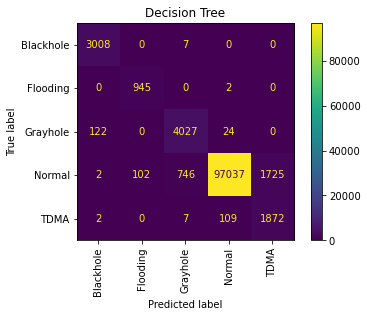

In [70]:
plot_confusion_matrix(estimator = dt,X = X_test,y_true = y_test,xticks_rotation = 'vertical')
plt.title("Decision Tree");

In [71]:
dt_y_pred = dt.predict(X_test)
dt_y_probas = dt.predict_proba(X_test)

In [72]:
precision,recall,fscore,support = precision_recall_fscore_support(y_true = y_test,y_pred = y_pred)

In [73]:
print("Precision : ",precision,"\n")
print("recall : ",recall,"\n")
print("fscore : ",fscore,"\n")
print("support : ",support,"\n")

Precision :  [0.96756406 0.85456188 0.78930025 0.99878564 0.46399406] 

recall :  [0.9893864  0.99894403 0.97579679 0.96604827 0.94221106] 

fscore :  [0.97835356 0.9211295  0.8726961  0.98214422 0.62178743] 

support :  [ 3015   947  4173 99612  1990] 



In [74]:
prfs_metrics(y_true = y_test,y_pred = y_pred)

,Normal,Grayhole,Flooding,TDMA,Blackhole
precision,0.998786,0.789300,0.854562,0.463994,0.967564
recall,0.966048,0.975797,0.998944,0.942211,0.989386
F-measure,0.982144,0.872696,0.921130,0.621787,0.978354
support,99612.000000,4173.000000,947.000000,1990.000000,3015.000000


In [83]:
dt_steps = [('sampling',borderline_oversample),('model',dt)]
dt_pipeline = Pipeline(steps = dt_steps)
dt_pipeline

Pipeline(steps=[('sampling', BorderlineSMOTE(random_state=111)),
                ('model',
                 DecisionTreeClassifier(max_depth=10, random_state=111))])

In [84]:
dt_pipeline.fit(X_train,y_train)

Pipeline(steps=[('sampling', BorderlineSMOTE(random_state=111)),
                ('model',
                 DecisionTreeClassifier(max_depth=10, random_state=111))])

In [85]:
dt_pipe_y_pred = dt_pipeline.predict(X_test)
dt_pipe_y_probas = dt_pipeline.predict_proba(X_test)

In [86]:
"""Testing for Overfitting """

print("Accuracy (Test set) : ", dt_pipeline.score(X_test,y_test))
print("Accuracy (Train set) : ", dt_pipeline.score(X_train,y_train))

Accuracy (Test set) :  0.9878618879685065
Accuracy (Train set) :  0.9881195543075403


In [87]:
prfs_metrics(y_test,dt_pipe_y_pred)

,Normal,Grayhole,Flooding,TDMA,Blackhole
precision,0.998653,0.855427,0.902913,0.859963,0.964579
recall,0.989861,0.972682,0.982049,0.941206,0.975456
F-measure,0.994237,0.910294,0.940819,0.898752,0.969987
support,99612.000000,4173.000000,947.000000,1990.000000,3015.000000


In [88]:
dt_roc_auc = roc_auc_score(y_test,dt_pipe_y_probas, multi_class='ovr')
print("Decision Tree RoC/AuC Score : {}".format(dt_roc_auc))

Decision Tree RoC/AuC Score : 0.993111660139434


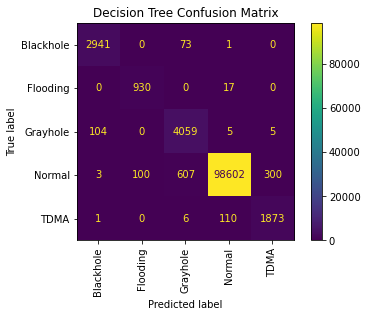

In [89]:
#confusion matrix
plot_confusion_matrix(estimator = dt_pipeline,X = X_test,y_true = y_test,xticks_rotation = 'vertical');
plt.title("Decision Tree Confusion Matrix");

### Log decision tree metrics to wandb

In [ ]:
wandb.init(group="Decision Tree", job_type="eval")
# dt_run = wandb.init(project = 'wsn-intrusion-detection',entity = 'mk-armah',name = 'Decision Tree')

In [59]:
# wandb.sklearn.plot_feature_importances(dt, X_train.columns)

In [60]:
# wandb.sklearn.plot_summary_metrics(dt, X_train, y_train, X_test, y_test)

In [1]:
wandb.sklearn.plot_classifier(dt_pipeline, 
                              X_train, X_test, 
                              y_train, y_test, 
                              y_pred, dt_pipe_y_probas, 
                              labels = y_test.unique(), 
                              is_binary=False,
                              model_name='Decision Tree')

NameError: name 'wandb' is not defined

# Naive Bayes

In [152]:
nb = GaussianNB()

In [153]:
nb.fit(X_train,y_train)

GaussianNB()

In [154]:
nb.score(X_test,y_test)

0.855326826867875

In [155]:
nb_cv_scores = cross_val_score(estimator = nb,cv = 10,X = X_train,y = y_train,error_score = True)
nb_cv_scores.mean()

0.8538142789987268

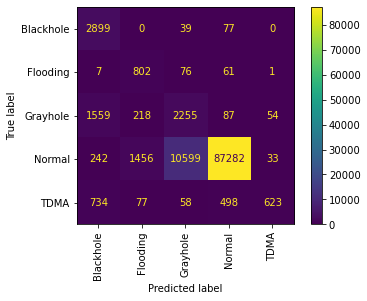

In [156]:
plot_confusion_matrix(estimator = nb,X = X_test,y_true = y_test,xticks_rotation = 'vertical');

In [141]:
y_test.unique()

array(['Normal', 'Grayhole', 'Flooding', 'TDMA', 'Blackhole'],
      dtype=object)

In [157]:
nb_y_pred = nb.predict(X_test)
nb_y_probas = nb.predict_proba(X_test)

In [158]:
precision,recall,fscore,support = precision_recall_fscore_support(y_true = y_test,y_pred = nb_y_pred)

In [159]:
nb_metrics = pd.DataFrame(
    
    precision_recall_fscore_support(
            y_test,nb_y_pred,
            labels = y_test.unique()),
    
    columns = y_test.unique(),
    index = ['precision',
             'recall',
             'F-measure',
             'support']
)

nb_metrics

,Normal,Grayhole,Flooding,TDMA,Blackhole
precision,0.991785,0.173102,0.314140,0.876231,0.532806
recall,0.876220,0.540379,0.846885,0.313065,0.961526
F-measure,0.930427,0.262209,0.458286,0.461311,0.685667
support,99612.000000,4173.000000,947.000000,1990.000000,3015.000000


In [107]:
nb_steps = [('sampling',borderline_oversample),('scaler',MinMaxScaler()),('model',nb)]
nb_pipeline = Pipeline(steps = nb_steps)
nb_pipeline

Pipeline(steps=[('sampling', BorderlineSMOTE()), ('scaler', MinMaxScaler()),
                ('model', GaussianNB())])

In [108]:
nb_pipeline.fit(X_train,y_train)

Pipeline(steps=[('sampling', BorderlineSMOTE()), ('scaler', MinMaxScaler()),
                ('model', GaussianNB())])

In [109]:
nb_cv_scores = cross_val_score(estimator = nb_pipeline,cv = 10,X = X_train,y = y_train,error_score = True)
nb_cv_scores.mean()

0.9515096526131203

In [110]:
nb_acc = nb_pipeline.score(X_test,y_test)
print("Naive Bayes Accuracy : {}".format(nb_acc))

Naive Bayes Accuracy : 0.9518758486198821


In [115]:
nb_pipeline_y_probas = nb_pipeline.predict_proba(X_test)
nb_pipeline_y_pred = nb_pipeline.predict(X_test)

In [130]:
"""Testing for Overfitting """

print("Accuracy (Test set) : ", nb_pipeline.score(X_test,y_test))
print("Accuracy (Train set) : ", nb_pipeline.score(X_train,y_train))

Accuracy (Test set) :  0.9518758486198821
Accuracy (Train set) :  0.9513924960261823


In [129]:
nb_roc_auc = roc_auc_score(y_test,nb_pipeline_y_probas, multi_class='ovr')
print("Naive Bayes RoC/AuC Score : {}".format(nb_roc_auc))

Naive Bayes RoC/AuC Score : 0.9704451010459657


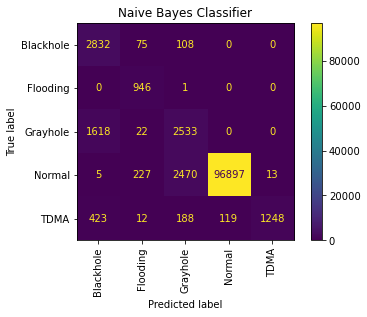

In [127]:
plot_confusion_matrix(estimator = nb_pipeline,X = X_test,y_true = y_test,xticks_rotation = 'vertical');
plt.title("Naive Bayes Classifier");

In [128]:
nb_metrics = pd.DataFrame(
    
    precision_recall_fscore_support(
            y_test,nb_pipeline_y_pred,
            labels = y_test.unique()),
    
    columns = y_test.unique(),
    index = ['precision',
             'recall',
             'F-measure',
             'support']
)

nb_metrics

,Normal,Grayhole,Flooding,TDMA,Blackhole
precision,0.998773,0.477925,0.737910,0.989691,0.580566
recall,0.972744,0.606997,0.998944,0.627136,0.939303
F-measure,0.985587,0.534783,0.848811,0.767764,0.717598
support,99612.000000,4173.000000,947.000000,1990.000000,3015.000000


### log naive bayes metrics to wandb

In [63]:
wandb.init(group="Naive Bayes", job_type="eval")

# nb_run = wandb.init(project = 'wsn-intrusion-detection',entity = 'mk-armah',name = 'Naive Bayes')

In [79]:
#precision, recall,fscore,support

wandb.sklearn.plot_summary_metrics(nb, X_train, y_train, X_test, y_test)

In [ ]:
nb_y_probas = nb.predict_proba(X_test)

In [ ]:
wandb.sklearn.plot_classifier(rf_pipeline, 
                              X_train, X_test, 
                              y_train, y_test, 
                              y_pred, y_probas, 
                              labels, 
                              is_binary= False
                              model_name='Naive Bayes')

# Ensemble Models

## Bagging

### Random Forest Classifier

In [84]:
rf = RandomForestClassifier(n_estimators = 400,random_state = 42)
rf_steps = [('sampling',borderline_oversample),('model',rf)]

In [86]:
rf_pipeline = Pipeline(steps = rf_steps)
rf_pipeline

Pipeline(steps=[('sampling', BorderlineSMOTE()),
                ('model',
                 RandomForestClassifier(n_estimators=400, random_state=42))])

In [87]:
rf_pipeline.fit(X_train,y_train)

Pipeline(steps=[('sampling', BorderlineSMOTE()),
                ('model',
                 RandomForestClassifier(n_estimators=400, random_state=42))])

In [88]:
rf_cv_scores = cross_val_score(estimator = rf_pipeline,cv = 10,X = X_train,y = y_train,error_score = 'raise')
print("Random Forest Cross Validation Score : {}".format(rf_cv_scores.mean()))

0.9960281336924869

In [168]:
rf_accuracy = rf_pipeline.score(X_test,y_test)
print("Random Forest Accuracy : {}".format(rf_accuracy))

Random Forest Accuracy : 0.9960450896233722


In [1]:
rf_roc_auc = roc_auc_score(y_test, rf.predict_proba(X_test), multi_class='ovr')
print("Random Forest RoC/AuC Score : {}".format(rf_roc_auc))

NameError: name 'roc_auc_score' is not defined

### wandb random forest metrics to wandb

In [ ]:
rf_y_probas = rf_pipeline.predict_probas(X_test)

In [82]:
wandb.init(group="Random Forest", job_type="eval")

#rf_run = wandb.init(project = 'wsn-intrusion-detection',entity = 'mk-armah',name = 'Random Forest')

In [ ]:
wandb.sklearn.plot_classifier(rf_pipeline, 
                              X_train, X_test, 
                              y_train, y_test, 
                              y_pred, rf_y_probas, 
                              labels, 
                              is_binary = False,
                              model_name = 'Random Forest')

## Boosting

In [193]:
adaboost = AdaBoostClassifier(base_estimator = DecisionTreeClassifier(max_depth = 10),n_estimators = 50,random_state = 42)
adaboost

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=10),
                   random_state=42)

In [196]:
adaboost_pipeline = Pipeline([('sampling',borderline_oversample),('model',adaboost)])
adaboost_pipeline

Pipeline(steps=[('sampling', BorderlineSMOTE()),
                ('model',
                 AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=10),
                                    random_state=42))])

In [199]:
adaboost_cv_scores = cross_val_score(estimator = adaboost_pipeline,X = X_train,y = y_train,cv = 10,error_score= 'raise')
adaboost_cv_scores.mean()

0.9870806865939858

In [202]:
adaboost.fit(X_train,y_train)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=10),
                   random_state=42)

In [204]:
adaboost.score(X_test,y_test)

0.9963002451315418

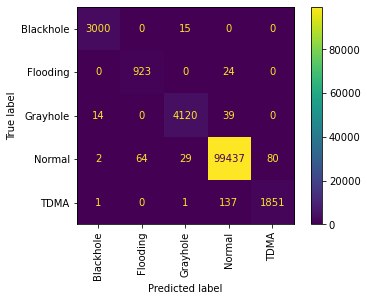

In [212]:
plot_confusion_matrix(estimator = adaboost,X = X_test,y_true = y_test,xticks_rotation='vertical');

### log Adaboost to wandb

In [ ]:
wandb.init(group="Adaboost", job_type="eval")

In [ ]:
abd_y_probas = adaboost.predict_proba(X_test)

In [ ]:
wandb.sklearn.plot_classifier(rf_pipeline, 
                              X_train, X_test, 
                              y_train, y_test, 
                              y_pred, adb_y_probas, 
                              labels, 
                              is_binary= False,
                              model_name='Adaboost')

## Stacking

In [232]:
xgb = XGBClassifier()
xgb.fit(X_train,y_train)

D:\Users\mk-armah\miniconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:20:14] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=12,
              num_parallel_tree=1, objective='multi:softprob', predictor='auto',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=None,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)

In [233]:
xgb.score(X_train,y_train)

0.9988361693568859

In [234]:
xgb.score(X_test,y_test)

0.9972479655904571

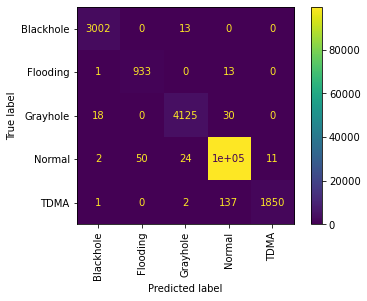

In [257]:
plot_confusion_matrix(estimator = xgb,X = X_test,y_true = y_test,xticks_rotation='vertical');

In [242]:
stk_clf = StackingClassifier(classifiers = [dt,adaboost,rf],
                       meta_classifier = XGBClassifier(),
                        use_features_in_secondary = True)

In [251]:
stk_clf.fit(X_train,y_train_le)

D:\Users\mk-armah\miniconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:59:01] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


StackingClassifier(classifiers=[DecisionTreeClassifier(max_depth=10,
                                                       random_state=111),
                                AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=10),
                                                   random_state=42),
                                RandomForestClassifier(n_estimators=400)],
                   meta_classifier=XGBClassifier(base_score=None, booster=None,
                                                 colsample_bylevel=None,
                                                 colsample_bynode=None,
                                                 colsample_bytree=None,
                                                 enable_c...
                                                 learning_rate=None,
                                                 max_delta_step=None,
                                                 max_depth=None,
                                                 min_child_weight=None,
                                                 missing=nan,
                                                 monotone_constraints=None,
                                                 n_estimators=100, n_jobs=None,
                                                 num_parallel_tree=None,
                                                 predictor=None,
                                                 random_state=None,
                                                 reg_alpha=None,
                                                 reg_lambda=None,
                                                 scale_pos_weight=None,
                                                 subsample=None,
                                                 tree_method=None,
                                                 validate_parameters=None,
                                                 verbosity=None),
                   use_features_in_secondary=True)

In [ ]:
stk_clf_cv_scores = cross_val_score(estimator = stk_clf,X = X_train,y = y_train,cv = 10,error_score = 'raise')
stk_clf_cv_scores.mean()

In [255]:
stk_clf.score(X_test,y_test_le)

0.9969290212052453

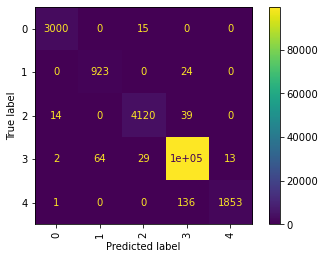

In [256]:
plot_confusion_matrix(estimator = stk_clf,X = X_test,y_true = y_test_le,xticks_rotation='vertical');

### log stacking classifier to wandb

In [250]:
le = LabelEncoder()
y_train_le = le.fit_transform(y_train)

In [249]:
le.classes_

array(['Blackhole', 'Flooding', 'Grayhole', 'Normal', 'TDMA'],
      dtype=object)

In [254]:
y_test_le = le.transform(y_test)

In [ ]:
wandb.init(group = "Stacking Classifier", job_type="eval")

In [ ]:
stk_y_probas = stk.predict_probas(y_test_le)

In [ ]:
wandb.sklearn.plot_classifier(rf_pipeline, 
                              X_train, X_test, 
                              y_train, y_test, 
                              y_pred, rf_y_probas, 
                              labels, 
                              is_binary=False,
                              model_name='Stacking Classifier')

## Neural Network

In [ ]:
class wsNet(nn.Module):
    def __init__(self, num_units=10):
        super(wsNet, self).__init__()
         
        self.relu =nn.ReLU()
        self.first_dense = nn.Linear(20, num_units)
        self.dropout = nn.Dropout(0.5)
        self.second_dense = nn.Linear(num_units, 10)
        self.output = nn.Linear(10, 5)

    def forward(self, X, **kwargs):
        X = self.first_dense(X)
        X = self.relu(X)
        X = self.dropout(X)
        X = self.second_dense(X)
        X = self.relu(X)
        X = self.output(X)
        return X

In [ ]:
wsnet_model = NeuralNetClassifier(
    wsNet,
    max_epochs=10,
    criterion=nn.CrossEntropyLoss(),
    lr=0.1,
    # Shuffle training data on each epoch
    iterator_train__shuffle=True,
)

In [ ]:
wsnet_pipe = Pipeline([
        ('sampling_strategy',BorderlineSMOTE()),
        ('model',wsnet_model)
])

In [ ]:
wsnet_pipe.fit(X_train, y_train)
y_proba = net.predict_proba(X)

In [ ]:
pipe.fit(X, y)
y_proba = pipe.predict_proba(X)

In [ ]:
pipe.score(X_test,y_test)